In [156]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import os
import tensorflow as tf
import numpy as np
from PIL import Image
import keras
from keras.applications.inception_v3 import InceptionV3
from keras.applications.resnet50 import ResNet50
from keras.applications.xception import Xception
from keras.applications.vgg16 import VGG16
from keras import backend as K
from scipy.ndimage.filters import gaussian_filter

import utils; reload(utils)
from utils import *
from IPython.core.debugger import Tracer

%matplotlib inline

In [179]:
# Prepare a tensor to be displayed as image
# Not used currently 
def deprocess_gradient(x):
    x = x.copy()
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def resize_array(array, size):
    '''Resizes an image (formatted as np array) to give size.
    Args:
        array: np array representing the image.
        size: The desired size.
    Returns: The resized image as a float np array.
    '''
    image = Image.fromarray(array.astype('uint8').copy())
    image_resized = image.resize(size)
    return np.asarray(image_resized).astype(float)

In [15]:
# DPI of monitor (for matplotlib)
dpi = 80

image_size = (600, 600)
channels = 3 # 3 for color image, 1 for grayscale
tile_size = (600, 600)

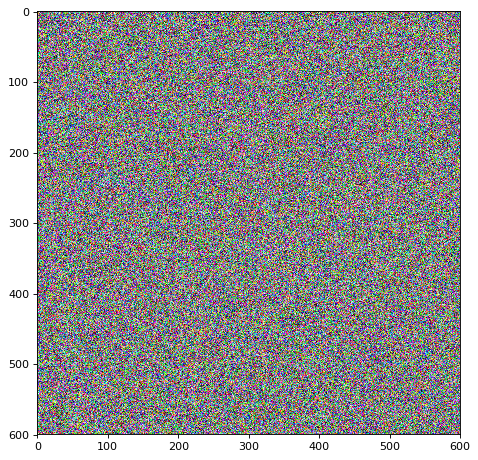

In [168]:
def get_image(size, random_noise=None, filename=None):
    '''Generate or load an image and return it as np array. 
        Args:
            size: The desired dimensions of the output image.
            random_noise: Whether to generate a random noise 
             image or to load a picture.
            filename: The fullpath to the image to load.
    '''
    width, height = size
    
    if not random_noise:
        random_noise = False

    if random_noise:
        # Generate a random noise image
        img = np.random.random(size=(width, height, 3))
        img_array = img * 256 
        # Another way to generate randomness (could be useful)
        # img_array = (img - 0.5) * 20 + 128
    else:
        if not filename:
            raise ValueError('If not generating random noise image, image filename is required.')
        # Load a picture
        img = Image.open(filename)
        img = img.resize((width, height))
        img_array = np.asarray(img.copy())

    return img_array

image = get_image(size=image_size, random_noise=True, filename='slav.jpg')
plot(image, dpi=dpi)

In [189]:
def setup_model(tile_size, normalize_input=False):
    '''Load the model. Use a TF tensor as input just for fun.
    Args: 
        tile_size: The dimensions of a single tile.
        normalize_input: Whether to normalize the input image.
    '''
    tile_width, tile_height = tile_size
    # Prepare tensor for input image
    image_tensor = tf.placeholder(
        dtype=tf.float32, 
        shape=(1, None, None, 3))

    if normalize_input:
        # Normalize input image
        input_normalized = tf.image.per_image_standardization(image_tensor)
        # Add a batch dimension to the image (required by keras model)
        input_batch = tf.expand_dims(input_normalized, axis=0)
        input_tensor = input_batch
    else:
        input_tensor = image_tensor

    model = Xception(include_top=False, weights='imagenet', 
                       input_tensor=input_tensor)
    input_tensor = image_tensor
    return model, input_tensor

K.set_learning_phase(0)
sess = tf.Session()
K.set_session(sess)

with sess.as_default():
    model, input_tensor = setup_model(tile_size)
    model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_10 (InputLayer)            (1, None, None, 3)    0                                            
____________________________________________________________________________________________________
block1_conv1 (Convolution2D)     (1, None, None, 32)   864         input_10[0][0]                   
____________________________________________________________________________________________________
block1_conv1_bn (BatchNormalizat (1, None, None, 32)   128         block1_conv1[0][0]               
____________________________________________________________________________________________________
block1_conv1_act (Activation)    (1, None, None, 32)   0           block1_conv1_bn[0][0]            
___________________________________________________________________________________________

In [144]:
def setup_gradient(input_tensor, result_tensor):
    '''Setup the gradient tensor of the input tensor w.t.r 
    to the result tensor.
    Args: 
        input_tensor: The input features tensor.
        result_tensor: The tensor that we want to maximize.
    '''
    # First get the result mean
    excitement_score = tf.reduce_mean(tf.square(result_tensor))
    # Gradients give us how to change the input (input_tensor) 
    # to increase the excitement_score.
    gradient = tf.gradients(excitement_score, input_tensor)[0]
    # normalize the gradient by its L2 norm
    gradient_norm = gradient / (tf.sqrt(tf.reduce_mean(tf.square(gradient))) 
                                + 1e-5)

    return gradient_norm, excitement_score

In [141]:
# Slice an image into tiles so that we can process 
# larger images with limited GPU memory.
def get_tile_coordinates(max_size, tile_size):
    ''' Generate tile coordinates for image.
    Args:
        max_size: The dimensions of the whole image.
        tile_size: The dimensions of a single tile.

    '''
    master_width, master_height = max_size
    tile_width, tile_height = tile_size
    
    tiles = []
    for x in range(0, master_width, tile_width):
        for y in range (0, master_height, tile_height):
            tile_x1 = x
            tile_y1 = y
            tile_x2 = x + tile_width
            tile_y2 = y + tile_height

            # If we dont have enough pixels for a full tile, 
            # slide the tile a bit into the previous one.
            # This is done because we want to process all 
            # parts of the image.
            if tile_x2 > master_width:
                tile_x1 = master_width - tile_width
                tile_x2 = master_width 
            if (tile_y2 > master_height):
                tile_y1 = master_height - tile_height
                tile_y2 = master_height 
                
            tile = (tile_x1,tile_y1,tile_x2,tile_y2)
            tiles.append(tile)
    return tiles

def add_randomness_to_tile(tile_coordinates, max_size, randomness_factor=0.1):
    ''' Generate randomness in the x and y coords 
        so that we dont get seams between the tiles.
        Args:
            tile_coordinates: A tupple of (x1,y1,x2,y2) coords
                for the tile.
            max_size: The dimension of the master image.
            randomness_factor: How much to change the tile_coords. This
                is a fraction between [0,1].
    '''
    x1,y1,x2,y2 = tile_coordinates
    tile_width = x2-x1
    tile_height = y1-y2
    max_x, max_y = max_size
    
    # Calculate the random change in x and y.
    rand_x = int((tile_width*randomness_factor*
                  (np.random.random()-0.5)*2))
    rand_y = int((tile_height*randomness_factor*
                  (np.random.random()-0.5)*2))
    # check if the new coords will go outside the max range
    if (x1 + rand_x < 0) or (x2 + rand_x > max_x):
        rand_x = 0
    if (y1 + rand_y < 0) or (y2 + rand_y > max_y):
        rand_y = 0

    x1 += rand_x
    x2 += rand_x
    y1 += rand_y
    y2 += rand_y

    return x1,y1,x2,y2

In [185]:
def calculate_gradient(input_array, gradient_tensor, 
                       score_tensor, input_tensor):
    '''Calculate the gradient.
    Args: 
        input_array: An 3d np array with the input image.
        gradient_tensor: Gradient computation tensor.
        score_tensor: Score of how much gradient_tensor activates.
        input_tensor: The tensor where the input_array should be fed.
        '''
    # Add a batch dimension to the image
    input_batch = np.expand_dims(input_array, axis=0)
    # Compute the gradient and the loss
    gradient_computed, score_computed = sess.run(
        [gradient_tensor, score_tensor], 
        feed_dict={input_tensor: input_batch})
    # Add gradient to image to feed back into the model
    return np.squeeze(gradient_computed), score_computed


def run_update_on_tiles(image, tile_size, 
                        iterations, step,
                        color_preservation_factor,
                        gradient_tensor, score_tensor,
                        input_tensor):
    '''Separate image in tiles and run gradient update on them,
        to maximize the activations of gradient_tensor, 
        as measured by score tensor.
    Args:
        image: An 3d np array with the image to update
        tile_size: Size of a single tile.
        iterations: How many times to process each tile.
        step: How strong should the gradient update be
        color_preservation_factor: How much of the original 
            colors should be preserved vs the psychedelic 
            colors of dreaming.
        gradient_tensor: Gradient computation tensor.
        score_tensor: Score of how much gradient_tensor activates.
        input_tensor: The tensor where the input_array should be fed.
    '''
    max_size = image.shape[:2]
    # We will the history of how each tile changes here.
    tile_history = []

    # Generate the tile coordinates
    tiles = get_tile_coordinates(max_size, tile_size)
    
    # Process each tile and then sew them together
    print('\nTile (of {}): '.format(len(tiles)), end=' ')
    for tile_index, tile_coordinates in enumerate(tiles):
        tile_history.append([])
        for iteration_index in range(iterations):
            x1,y1,x2,y2 = add_randomness_to_tile(
                tile_coordinates=tile_coordinates,
                max_size=max_size,
                randomness_factor = 0.1)
            input_image = image[x1:x2, y1:y2]

            gradient_computed, score_computed = calculate_gradient(
                input_image, gradient_tensor,
                score_tensor, input_tensor)
            print('({})'.format(score_computed), end=' ')
            # Blur the gradient, preserving more of the original image colors.
            # sigma increases from [1, 8.2] before scaling with
            # color_preservation_factor.
            sigma = (iteration_index * 4.0 / iterations + 0.5) * 2
            sigma *= color_preservation_factor
            grad_smooth1 = gaussian_filter(gradient_computed, sigma=sigma*0.5)
            grad_smooth2 = gaussian_filter(gradient_computed, sigma=sigma*1)
            grad_smooth3 = gaussian_filter(gradient_computed, sigma=sigma*2)
            gradient_blurred = (grad_smooth1 + grad_smooth2 + grad_smooth3)

            # Uncomment this to display the gradient itself
            # display_img_array(deprocess_gradient(gradient_blurred))
            
            # Normalize gradient 
            gradient_blurred /= (gradient_blurred.std() + 1e-8)
            
            gradient_blurred *= step
            output_image = input_image + gradient_blurred
            output_image = np.clip(output_image, 0, 255)

            image[x1:x2, y1:y2] = output_image
            tile_history[tile_index].append(output_image)
            #print('{:.2f}'.format(score_computed), end=' ')

        print(tile_index+1, end=' ')

    return image, tile_history

def multilevel_dream(image, tile_size, 
                     gradient_tensor,
                     score_tensor,
                     input_tensor,
                     color_preservation_factor=0.5,
                     iterations=10, step=5, 
                     levels=3, 
                     blending_factor=0.5):
        ''' Create a deep dream by applying the algo at several different levels.
        Args:
            image: An 3d np array with the image to update
            tile_size: Size of a single tile.
            gradient_tensor: Gradient computation tensor.
            score_tensor: Score of how much gradient_tensor activates.
            input_tensor: The tensor where the input_array should be fed.            
            color_preservation_factor: How much of the original 
                colors should be preserved vs the psychedelic 
                colors of dreaming. Higher values preserve more 
                of the original colors. Between [0,1], 0.5 by default. 
            iterations: How many times to process each tile.
            step: How strong should the gradient update be
            levels: How deep to dream.
            blending_factor: How much of the original image to keep (0 to 1).
                Lower values result in more psychedelic images. Default 0.5.
        '''
        img = image.copy()
        original_size = img.shape[:2]

        tile_history = []

        for level in range(levels):
            resize_to = (tile_size[0]*(level+1), tile_size[1]*(level+1))
            resized_img = resize_array(img, resize_to)
            
            update_image, tile_history_level = run_update_on_tiles(
                resized_img, tile_size, 
                iterations, step, 
                color_preservation_factor,
                gradient_tensor, score_tensor,
                input_tensor)

            tile_history.append(tile_history_level)

            update_image = resize_array(update_image, original_size)
            # Keep part of the original image
            img = blending_factor * img + (1.0 - blending_factor) * update_image
        return img, tile_history

# Dreaming with other networks

Tensor("strided_slice_36:0", shape=(1, 13, 13, 728), dtype=float32)

Tile (of 1):  (137.22354126) (333.212615967) (1225.82446289) (3468.16357422) (6344.59423828) (9606.73632812) (12888.1015625) (17841.7246094) (23270.265625) (29101.6464844) 1 

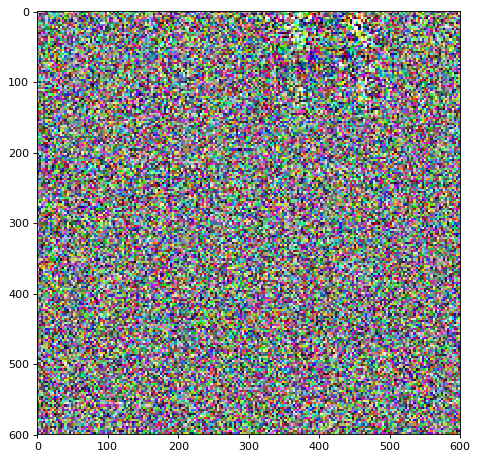

In [188]:
# Set the layer/neuron to excite
output_tensor = model.get_layer(
    'block11_sepconv3').output[:,:,:,:] #model.layers[-1].output
    #'convolution2d_84').output[:,:,:,:]
print(output_tensor)
gradient_tensor, score_tensor = setup_gradient(
    input_tensor=input_tensor, result_tensor=output_tensor)

# Now dream.
output_image, tile_history = multilevel_dream(
    image=image, tile_size=tile_size, 
    gradient_tensor=gradient_tensor,
    score_tensor=score_tensor,
    input_tensor=input_tensor, 
    color_preservation_factor=0,
    iterations=10,
    step=5,
    levels=1, 
    blending_factor=0)

# Show what we got
plot(output_image.astype('uint8'), scale=1, dpi=dpi)

# Dreaming with VGG16


Tile (of 1):  0 
Tile (of 4):  0 1 2 3 
Tile (of 9):  0 1 2 3 4 5 6 7 8 
Tile (of 16):  0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 
Tile (of 25):  0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 

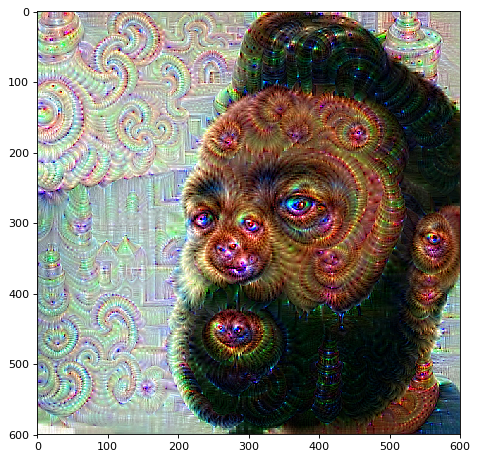

In [110]:
# Perform the dream
output_image, tile_history = multilevel_dream(
    image=image, tile_size=tile_size, 
    gradient_tensor=gradient_tensor,
    score_tensor=score_tensor,
    input_tensor=input_tensor, 
    color_preservation_factor=0,
    levels=5, 
    blending_factor=0.5)

# Show what we got
plot(output_image.astype('uint8'), scale=1, dpi=dpi)

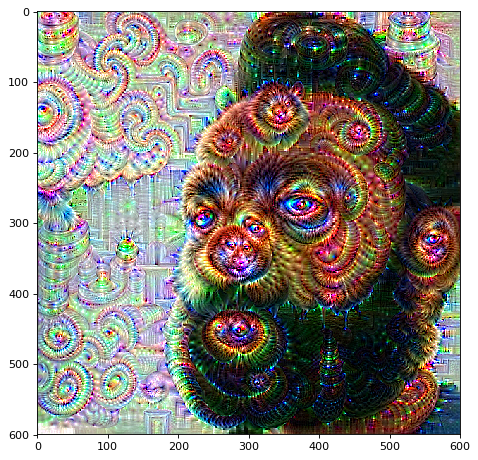

In [69]:
# Perform the dream
output_image, tile_history = multilevel_dream(
    image=image, tile_size=tile_size, 
    gradient_tensor=gradient_tensor,
    score_tensor=score_tensor,
    input_tensor=input_tensor, 
    color_preservation_factor=0,
    levels=5, 
    blending_factor=1)

# Show what we got
plot(output_image.astype('uint8'), scale=1, dpi=dpi)


Tile (of 1):  0 
Tile (of 4):  0 1 2 3 
Tile (of 9):  0 1 2 3 4 5 6 7 8 

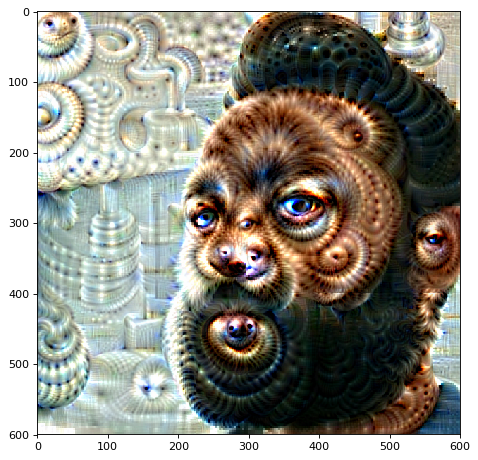

In [106]:
# Perform the dream
output_image, tile_history = multilevel_dream(
    image=image, tile_size=tile_size, 
    gradient_tensor=gradient_tensor,
    score_tensor=score_tensor,
    input_tensor=input_tensor, 
    color_preservation_factor=0.5,
    iterations=10,
    step=5,
    levels=3, 
    blending_factor=0.1)

# Show what we got
plot(output_image.astype('uint8'), scale=1, dpi=dpi)


Tile (of 1):  0 
Tile (of 4):  0 1 2 3 
Tile (of 9):  0 1 2 3 4 5 6 7 8 

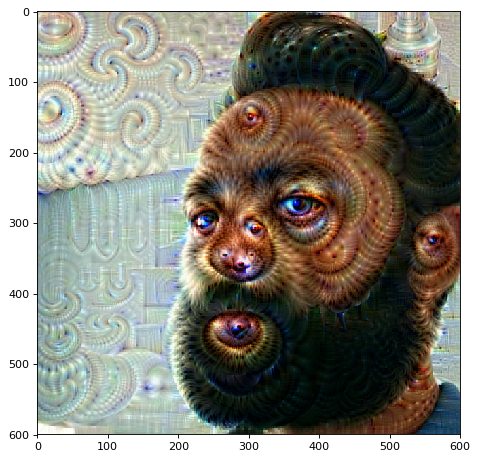

In [117]:
# Perform the dream
output_image, tile_history = multilevel_dream(
    image=image, tile_size=tile_size, 
    gradient_tensor=gradient_tensor,
    score_tensor=score_tensor,
    input_tensor=input_tensor, 
    color_preservation_factor=0.25,
    iterations=10,
    step=5,
    levels=3, 
    blending_factor=0.5)

# Show what we got
plot(output_image.astype('uint8'), scale=1, dpi=dpi)

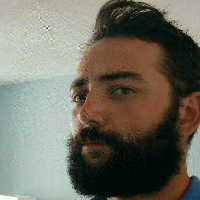

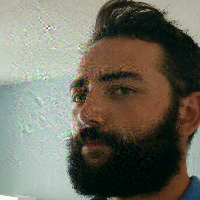

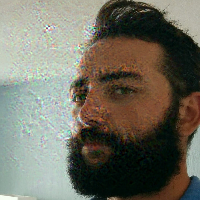

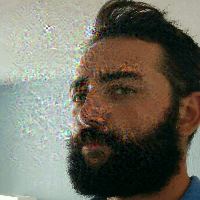

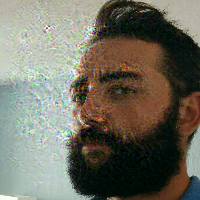

...

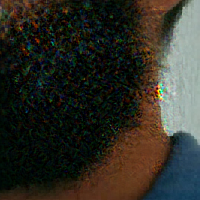

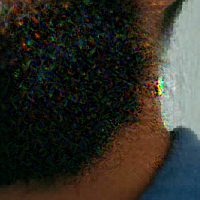

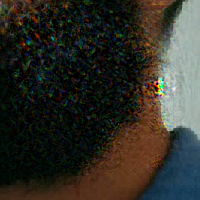

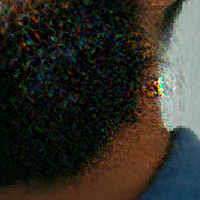

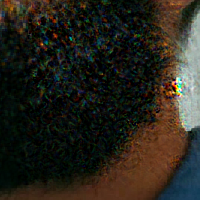

In [139]:
# Display how the tiles changed during the iterations
for tile_history_level in tile_history:
    tile_history_array = np.clip(np.asarray(tile_history_level), 0, 255).astype('uint8')
    for tile_images in tile_history_array:
        for tile_image in tile_images:
            display_img_array(tile_image)